# Semantic Segmentation Animals

### Semantic Segmentation of Animals Using a Custom PSPNet-Inspired Architecture

This project tackles the problem of **semantic segmentation** of animals with three distinct classes:

* **Background** (label 0)
* **Cat** (label 1)
* **Dog** (label 2)

![Image](https://miro.medium.com/max/1130/1*DDEkOFC93pEbrTdyhdpXZg.png)

The goal is to build a complete pipeline from scratch, including:

* Preparing a custom dataset ([download link](https://drive.google.com/uc?export=download&id=1ZsRAXiPgOU5Am8tNZ7mruwtJh3ck8TI5))
* Implementing evaluation metrics and loss functions
* Designing and training a **PSPNet-inspired neural network architecture** for semantic segmentation

In [ ]:
# Downloading data
!gdown -q --id 1ZsRAXiPgOU5Am8tNZ7mruwtJh3ck8TI5 -O data.zip
!unzip -qq data.zip

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(


### Importing Required Modules

In [ ]:
# PyTorch modules for building and training neural networks
import torch
import torch.nn as nn
import torch.nn.functional as F

# Image transformations and visualization
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode as IM
import matplotlib.pyplot as plt

# Logging training metrics and loss values
from torch.utils.tensorboard import SummaryWriter

# Tools for working with custom datasets and data loaders
from torch.utils.data import Dataset, DataLoader

# Miscellaneous utilities
import numpy as np
from tqdm.notebook import tqdm

## Part 1: Data Preparation

### 1.1 Dataset Preprocessing

To begin working with the dataset, the following steps are carried out:

* **Choosing an Optimal Data Storage/Loading Format**
  Three options for storing and loading image-mask pairs are benchmarked:

  * `HDF5`
  * `Memory-mapped files`
  * Raw image files stored as `.jpg`/`.png`

  The necessary loader classes are already implemented (see `utils.py`). The task here is to measure and compare the data reading speeds of each method and select the most efficient one.

  A few technical notes on these formats:

  * **HDF5** is well-suited for large-scale computer vision datasets that cannot fit entirely in memory. It organizes data into [chunks](https://www.oreilly.com/library/view/python-and-hdf5/9781491944981/ch04.html) using a [B-tree](https://en.wikipedia.org/wiki/B-tree) structure, enabling efficient access to non-contiguous multidimensional data slices (hyperslabs). By default, HDF5 stores data in a contiguous layout, but chunked layouts are more flexible and scalable.
  * **Memory-mapped files** allow direct lazy loading of data into memory without buffer duplication, potentially improving performance. This approach works best when accessing contiguous memory blocks but can degrade significantly with non-contiguous access patterns—something HDF5 handles more gracefully.

* **Resizing All Image-Mask Pairs to a Common Target Shape**
  All samples are resized to a uniform `target_shape` defined in the `default_config` dictionary. The following sequence is applied:

  1. **Resize using [`transforms.Resize`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Resize.html)**
     The image is resized using bilinear interpolation by default. However, naive resizing may distort the original aspect ratio, which can negatively affect model performance. For example, the appearance of a cat's face may vary based on the image's original size rather than the class-specific features, leading to inconsistent representations during training. Fortunately, when passed an integer value, `transforms.Resize` automatically resizes the shorter edge to the given value while preserving the aspect ratio.

  2. **Crop using [`transforms.CenterCrop`](https://pytorch.org/vision/stable/generated/torchvision.transforms.CenterCrop.html)**
     If the longer edge is still larger than the target dimension after resizing, the image is center-cropped to match the target shape.

> These transformation steps can be composed using [`transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html).

* **Why Standardize Image Sizes?**
  Standardizing all images to the same size is critical for efficient batch processing in neural networks. Convolutional layers expect consistent input dimensions, and variable-sized inputs would either require padding or complex model modifications. Uniform input sizes also ensure stability during training and inference, particularly for operations involving fixed-size kernels and pooling layers.

**Why Resize All Images to the Same Dimensions?**

Resizing images to a uniform size (and roughly the same scale) is primarily done to meet the architectural requirements of neural networks. For example, fully connected layers expect inputs of a fixed shape, making consistent dimensions essential.

Even in fully convolutional networks, which are not strictly bound to input size, the convolutional filters can still be sensitive to the scale of the objects in the image. Inconsistent object sizes across samples may lead to poor generalization or unstable training behavior.

Additionally, when using mini-batches (in the standard PyTorch format `N x C x H x W`), all images in the batch must have the same height and width. While it's technically possible to work around this using a custom `collate_fn` in the `DataLoader`, standardizing input sizes remains the most practical and efficient solution.

Uniform sizing can also improve computational efficiency and resource usage. Smaller or standardized images reduce memory overhead and can speed up training, while also enabling optimizations such as upscaling with interpolation to preserve feature consistency.

In [ ]:
from utils import *

def resize(img: Image_t, target_shape: tuple[int, int]) -> np.array:
    """
    Resizes the input image or segmentation mask to the specified `target_shape`
    using a two-step process: resizing the shorter side and center cropping.

    Note:
        The `target_shape` is expected to be square, i.e., (H, W) where H == W.

    Args:
        img (Image_t): Input image or segmentation mask (PIL.Image).
        target_shape (tuple[int, int]): Desired output dimensions (height, width).

    Returns:
        np.array: Transformed image or mask as a NumPy array.
    """
    # Ensure the target shape is square
    assert target_shape[0] == target_shape[1]

    # Resize the shortest side to match the target dimension
    # Nearest neighbor interpolation is used to preserve discrete mask values
    img = transforms.Resize(target_shape, interpolation=IM.NEAREST)(img)

    resize_transform = transforms.Compose([
        # Center crop to ensure exact target shape, if needed
        transforms.CenterCrop(target_shape),

        # Convert the final PIL image to a NumPy array
        transforms.Lambda(lambda pil_image: np.array(pil_image))
    ])

    return resize_transform(img)

In [ ]:
def prepare_dataset(config: dict, storage_class: Type[storage_class]):
    """
    Preprocesses the dataset and efficiently stores it on disk using the specified storage backend.

    Args:
        config (dict): Configuration dictionary containing dataset parameters.
        storage_class (Type): Storage class responsible for handling dataset saving and indexing.

    Returns:
        dataset (storage_class instance): Initialized and populated dataset object.
    """
    with open(config["annotation_file"]) as f:
        lines = f.readlines()

    # Preallocate memory for data chunks
    input_chunk = np.empty((config["chunk_size"], *config["target_shape"], 3), dtype=np.uint8)
    target_chunk = np.empty((config["chunk_size"], *config["target_shape"]), dtype=np.uint8)

    # Compute number of chunks and initialize dataset storage
    config["dataset_size"] = len(lines)
    num_chunks = config["dataset_size"] // config["chunk_size"] + bool(config["dataset_size"] % config["chunk_size"])
    dataset = storage_class(config)

    # Read, preprocess, and store data chunk by chunk
    for chunk_idx in tqdm(range(num_chunks), desc="Preparing dataset"):
        for pos in range(config["chunk_size"]):
            flat_idx = chunk_idx * config["chunk_size"] + pos
            if flat_idx >= config["dataset_size"]:
                break

            img_name, label = lines[flat_idx].rstrip("\n").split(" ")

            input_raw = Image.open(os.path.join(config["input_dir"], img_name + ".jpg")).convert("RGB")
            target_raw = Image.open(os.path.join(config["target_dir"], img_name + ".png")).convert("L")

            input_chunk[pos] = resize(input_raw, config["target_shape"])
            target_chunk[pos] = renumerate_target(resize(target_raw, config["target_shape"]), int(label))

        dataset.append(input_chunk, target_chunk)

    # Finalize dataset for reading
    dataset.lock()

    return dataset

To simplify processing and ensure consistency, all images and masks are resized to a square shape. In this project, a target resolution of `256x256` pixels is used, although this value can be adjusted based on available computational resources and desired output quality.

> ⚠️ Note: Larger image sizes may improve accuracy but will increase training time and memory usage.

In [ ]:
# If you need to re-run this cell and overwrite previously saved datasets,
# uncomment the line below to remove existing files:
# !rm -rf SegTask/trainval.h5 SegTask/trainval

# Dataset configuration
default_config = {
    "input_dir": "SegTask/images",
    "target_dir": "SegTask/seg_masks",
    "target_shape": (256, 256),  # You can choose a different resolution if needed
    "chunk_size": 512,           # Number of images to load into memory per chunk
}

# Training and test configurations differ only by their annotation files
config_train = {"annotation_file": "SegTask/trainval.txt"} | default_config
config_test = {"annotation_file": "SegTask/test.txt"} | default_config

# Preprocess and store datasets using three different storage backends
train_data_hdf5 = prepare_dataset(config_train, storage_hdf5)
train_data_memmap = prepare_dataset(config_train, storage_memmap)
train_data_raw = prepare_dataset(config_train, storage_raw)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

### 1.2 Creating a Custom Dataset and DataLoader

PyTorch provides convenient abstractions for handling datasets and batches through its [`Dataset`](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html) and [`DataLoader`](https://pytorch.org/docs/stable/data.html) interfaces. These tools make it easy to iterate over data in mini-batches of a specified size and support parallel data loading using the `num_workers` argument for efficient preprocessing.

Additionally, data **augmentation** plays a crucial role in enhancing the robustness of the model by artificially increasing the diversity of the training set. This is done by applying random transformations to input images that alter pixel values while preserving the semantic content.

For example:

* [`ColorJitter`](https://pytorch.org/vision/stable/generated/torchvision.transforms.ColorJitter.html) introduces random variations in brightness, contrast, saturation, and hue. This helps the model generalize better without altering the image’s semantic meaning.
* However, transformations like [`RandomCrop`](https://pytorch.org/vision/stable/generated/torchvision.transforms.RandomCrop.html) should be used cautiously. Cropping might exclude key features (e.g., a cat’s face), which could lead to ambiguous class labeling and degrade model performance.

> ⚠️ It's important to ensure that any transformation applied to an image is also applied **consistently** to its corresponding segmentation mask. Inconsistencies between image and mask augmentations would break the pixel-level alignment crucial for segmentation tasks.

**Required Augmentations:**
The following custom data augmentation transformations are implemented:

* `HorizontalFlip` — Horizontally flips an image and its corresponding mask with a specified probability.
* `ColorJitter` — Randomly changes the brightness, contrast, saturation, and hue of the image. Does not affect the mask.
* `RandomPerspective` — Applies a perspective transformation with a specified distortion scale and probability.

Each augmentation class implements the `__call__` method, allowing instances to behave like functions:

```python
# Example usage
transform = Example()
output = transform(input)
```

This design ensures seamless integration into PyTorch-style transformation pipelines.

In [ ]:
from torchvision.transforms.functional import hflip, perspective
from torchvision.transforms import ColorJitter as CJ
from torchvision.transforms import RandomPerspective as RP
from torchvision.transforms.functional import InterpolationMode as IM

class HorizontalFlip:
    def __init__(self, prob: float):
        """
        Initializes a horizontal flip transform with a given probability.

        Args:
            prob (float): Probability of applying the horizontal flip.
        """
        self.p = prob

    def __call__(self, pair: tuple[Image_t, Image_t]) -> tuple[Image_t, Image_t]:
        """
        Applies horizontal flip to both image and mask with probability `p`.

        Args:
            pair (tuple): A tuple of (image, segmentation mask), both as PIL Images.

        Returns:
            tuple: Transformed (image, mask) pair.
        """
        if np.random.binomial(1, self.p):
            pair = (hflip(pair[0]), hflip(pair[1]))
        return pair


class ColorJitter:
    def __init__(self, prob: float, param: tuple[float, ...]):
        """
        Initializes a color jitter transform with given parameters and probability.

        Args:
            prob (float): Probability of applying color jitter.
            param (tuple): Parameters for brightness, contrast, saturation, and hue.
        """
        self.p = prob
        self.CJ = CJ(*param)

    def __call__(self, pair: tuple[Image_t, Image_t]) -> tuple[Image_t, Image_t]:
        """
        Applies color jitter only to the input image, not the mask.

        Args:
            pair (tuple): A tuple of (image, segmentation mask), both as PIL Images.

        Returns:
            tuple: Transformed (image, mask) pair.
        """
        if np.random.binomial(1, self.p):
            pair = (self.CJ(pair[0]), pair[1])
        return pair


class RandomPerspective:
    def __init__(self, prob: float, param: float):
        """
        Initializes a random perspective transform.

        Args:
            prob (float): Probability of applying the perspective distortion.
            param (float): Distortion scale parameter.
        """
        self.p = prob
        self.distortion_scale = param

    def __call__(self, pair: tuple[Image_t, Image_t]) -> tuple[Image_t, Image_t]:
        """
        Applies random perspective transformation to both image and mask.

        Args:
            pair (tuple): A tuple of (image, segmentation mask), both as PIL Images.

        Returns:
            tuple: Transformed (image, mask) pair.
        """
        if np.random.binomial(1, self.p):
            width, height = pair[0].size
            params = RP.get_params(width, height, self.distortion_scale)
            pair = (
                perspective(pair[0], *params, interpolation=IM.NEAREST, fill=0),
                perspective(pair[1], *params, interpolation=IM.NEAREST, fill=0)
            )
        return pair

Let's now apply the implemented augmentation transforms and verify that they work correctly.

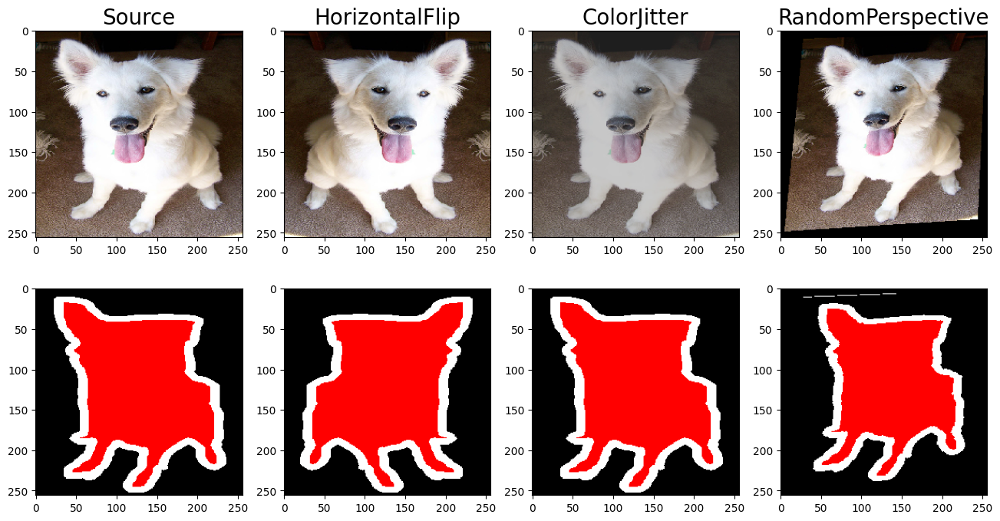

In [7]:
img_idx = np.random.randint(0, 100)
f, ax = plt.subplots(2, 4, figsize=(16, 8))
pair = train_data_hdf5[img_idx]

imgs2draw = {"Source": pair,
            "HorizontalFlip": HorizontalFlip(1.0)(pair),
            "ColorJitter": ColorJitter(1.0, (0.4, 0.4, 0.4))(pair),
            "RandomPerspective": RandomPerspective(1.0, 0.25)(pair)
}
for idx, (name, pair) in enumerate(imgs2draw.items()):
    ax[0, idx].imshow(pair[0])
    ax[0, idx].set_title(name, fontsize=20)
    ax[1, idx].imshow(colorize(np.array(pair[1])))

plt.show()

Next, we define the `SegmentationData` class, which handles loading image–mask pairs and applying all necessary transformations. This includes converting images from `PIL.Image` format to PyTorch tensors and applying **ImageNet-style normalization**.

ImageNet normalization is a specific case of [standard normalization](https://pytorch.org/vision/main/generated/torchvision.transforms.Normalize.html), where the per-channel mean and standard deviation (for red, green, and blue) have been precomputed on the large-scale [ImageNet dataset](https://en.wikipedia.org/wiki/ImageNet).

---

**Why Normalize Images?**

Normalization centers the pixel values around zero and scales them to have unit variance. This brings several advantages:

* **Faster convergence**: Optimizers like SGD and Adam work more efficiently when input data is standardized.
* **Improved numerical stability**: Reduces the risk of gradient explosion or vanishing during backpropagation.
* **Consistency with pretrained models**: If you're using a model pretrained on ImageNet (or similar), normalizing inputs in the same way ensures compatibility and better performance.

Normalization of images (or other features) improves **numerical stability** and can significantly **accelerate model convergence** during training. Even semantically similar features are often normalized independently because their statistical distributions may differ.

For example, in this project, **ImageNet normalization** is used. Despite being related (all are color channels), the red, green, and blue channels exhibit distinct value distributions across the large-scale ImageNet dataset. Normalizing them individually ensures that each channel contributes comparably to the learning process.

In [ ]:
# Select device for computation (preferably GPU if available)
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Transformation configuration for:
# - Forward pass (PIL.Image -> torch.Tensor)
# - Backward pass (for visualization: torch.Tensor -> numpy array)
# - Data augmentation (train only)
t_dict = {
    "forward_input": transforms.Compose([
        transforms.PILToTensor(),
        transforms.Lambda(lambda x: x.float().to(DEVICE) / 255.0),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ]),
    "backward_input": transforms.Compose([
        transforms.Normalize(mean=[0.0, 0.0, 0.0],
                             std=[1. / 0.229, 1. / 0.224, 1. / 0.225]),
        transforms.Normalize(mean=[-0.485, -0.456, -0.406],
                             std=[1.0, 1.0, 1.0]),
        transforms.Lambda(lambda x: x.permute(1, 2, 0).cpu().numpy())
    ]),
    "forward_target": transforms.Compose([
        transforms.PILToTensor(),
        transforms.Lambda(lambda x: x.long().squeeze().to(DEVICE)),
    ]),
    "backward_target": transforms.Compose([
        transforms.Lambda(lambda x: x.cpu().numpy())
    ]),
    "augment": transforms.Compose([
        HorizontalFlip(0.5),
        ColorJitter(0.5, (0.4, 0.4, 0.4)),
        RandomPerspective(0.5, 0.25)
    ]),
}


class SegmentationDataset(Dataset):
    def __init__(self, dataset_raw: Type[storage_class], transforms: dict, train_flag: bool = True):
        """
        Custom PyTorch Dataset for semantic segmentation.

        Args:
            dataset_raw (storage_class): Dataset storage object that supports indexing and size.
            transforms (dict): Dictionary of transformation pipelines for input, target, and augmentation.
            train_flag (bool): Whether to apply data augmentation (True for training, False for evaluation).
        """
        super().__init__()
        self.dataset_raw = dataset_raw
        self.transforms = transforms
        self.train_flag = train_flag

    def __len__(self):
        return self.dataset_raw.dataset_size

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        input_img, target_mask = self.dataset_raw[idx]

        # Apply augmentation only during training
        if self.train_flag:
            input_img, target_mask = self.transforms["augment"]((input_img, target_mask))

        # Apply standard transformations (PIL -> tensor, normalization, etc.)
        input_tensor = self.transforms["forward_input"](input_img)
        target_tensor = self.transforms["forward_target"](target_mask)

        return input_tensor, target_tensor

In [ ]:
from torch.utils.data import random_split

# Split preprocessed dataset into training and validation subsets
def split_train_val(train_data: Type[storage_class], train_portion: float = 0.8):
    """
    Splits the dataset into training and validation subsets.

    Args:
        train_data (storage_class): Preprocessed dataset instance.
        train_portion (float): Proportion of the dataset to allocate for training (default: 0.8).

    Returns:
        Tuple[Subset, Subset]: Training and validation subsets.
    """
    trainval_dataset = SegmentationDataset(train_data, t_dict, train_flag=True)

    train_size = int(len(trainval_dataset) * train_portion)
    val_size = len(trainval_dataset) - train_size
    return random_split(trainval_dataset, [train_size, val_size])

# Split the dataset for each storage format
train_dataset_hdf5, val_dataset_hdf5 = split_train_val(train_data_hdf5)
train_dataset_memmap, val_dataset_memmap = split_train_val(train_data_memmap)
train_dataset_raw, val_dataset_raw = split_train_val(train_data_raw)

Let's visualize a random sample from the dataset after applying the data augmentation pipeline.

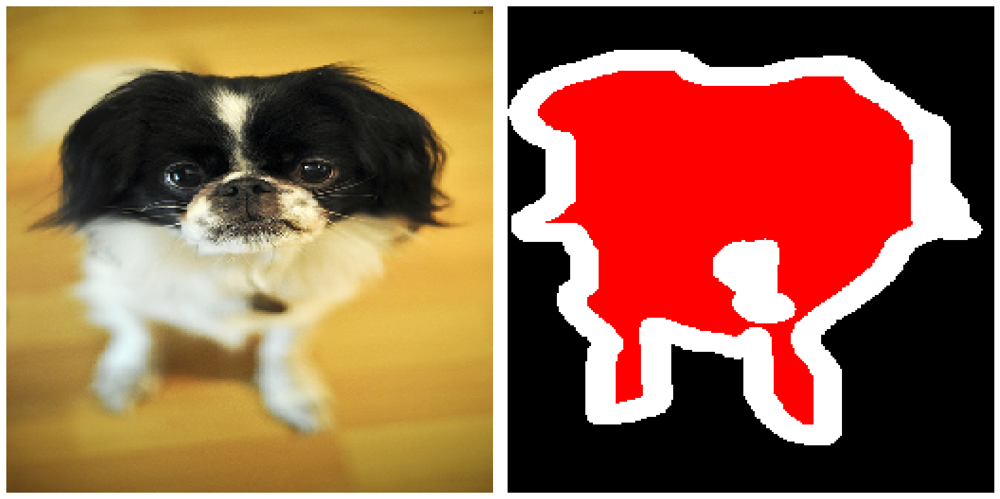

In [10]:
img_idx = np.random.randint(0, 100)
draw(train_dataset_hdf5[img_idx], t_dict);

In [11]:
dataloader_config = {
    "batch_size": 16,
    "shuffle": True,
    "num_workers": 0
}
train_dataloader_hdf5 = DataLoader(train_dataset_hdf5, **dataloader_config)
val_dataloader_hdf5 = DataLoader(val_dataset_hdf5, **dataloader_config)

train_dataloader_memmap = DataLoader(train_dataset_memmap, **dataloader_config)
val_dataloader_memmap = DataLoader(val_dataset_memmap, **dataloader_config)

train_dataloader_raw = DataLoader(train_dataset_raw, **dataloader_config)
val_dataloader_raw = DataLoader(val_dataset_raw, **dataloader_config)

### 1.3 Benchmarking Dataset Read Performance from Disk

**Measure the data loading time for each of the storage formats.**  
(All speed tests combined may take approximately 6 minutes.)

In [12]:
def speedtest(dataloader: Type[DataLoader]) -> None:
    for batch in dataloader:
        pass

In [13]:
%timeit speedtest(train_dataloader_hdf5)

12 s ± 189 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [14]:
%timeit speedtest(train_dataloader_memmap)

10.6 s ± 258 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [15]:
%timeit speedtest(train_dataloader_raw)

13.2 s ± 142 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


*Which data storage format proved to be the most efficient in terms of read speed? Why?*

*The most efficient format was likely **\[fill in: HDF5 / memory-mapped / raw]**, primarily due to \[explanation].*

* `HDF5` performs well for non-contiguous access patterns because of its chunked storage and B-tree indexing.
* `Memory-mapped files` are highly efficient for sequential, contiguous reads but degrade with random or scattered access.
* `Raw image files` are typically slower due to the overhead of file I/O and decompression for each individual image.

> Actual results may vary depending on disk type (SSD vs HDD), available RAM, and parallelization (via `num_workers` in `DataLoader`).

In this case, **memory-mapped storage** was the most efficient in terms of read speed. This is expected because the data layout is **contiguous**, which represents a best-case scenario for memory mapping. Memory-mapped files bypass the buffering and copying stages by mapping the file directly into memory, allowing fast, lazy access.

While **HDF5** is also an excellent storage format—particularly for large, non-contiguous data—it showed slightly lower performance in this specific setup. However, it has more consistent read speeds across varying access patterns due to its use of chunking and B-tree indexing.

**Raw image storage** (e.g., `.jpg` or `.png`) was the slowest due to I/O overhead and the need to decode each file during loading.

> For comparison: reading an 8GB 3D hyperslab using HDF5 might take around **20 seconds**, while memory-mapping can take as little as **0.3 seconds** or as much as **several hours**, depending on data layout and access patterns.

**Create a test DataLoader using the storage format that demonstrated the fastest read performance.**

In [ ]:
# DataLoader configuration for evaluation
dataloader_config = {
    "batch_size": 1,
    "shuffle": False,
    "num_workers": 0
}

# Prepare the test dataset using the fastest storage format (memory-mapped)
prepared_data = prepare_dataset(config_test, storage_memmap)
dataset = SegmentationDataset(prepared_data, t_dict, train_flag=False)
test_dataloader = DataLoader(dataset, **dataloader_config)

# Use the memory-mapped format for training and validation as well
train_dataloader = train_dataloader_memmap
val_dataloader = val_dataloader_memmap

  0%|          | 0/8 [00:00<?, ?it/s]

## Part 2: Implementation of Loss Functions, Metrics, and PSPNet Decoder

Previously, the **U-Net** architecture—a convolutional autoencoder widely used for image segmentation—was discussed. In this project, a more advanced segmentation architecture, [**PSPNet**](https://arxiv.org/abs/1612.01105), is explored.

A key innovation of PSPNet is the **Pyramid Pooling Module**, which, unlike U-Net, enables the network to capture both **global context** and **local features**. This approach improves segmentation accuracy, especially for scenes with objects at varying scales.

Let’s break down the proposed **PSPNet-inspired architecture** for semantic segmentation:

![picture](https://drive.google.com/uc?id=1WNumWndaJAbZBch0dLf6iT8KiSdUbIFG)

For the encoder, we use a pretrained [ResNeXt](https://pytorch.org/hub/pytorch_vision_resnext/) model. This encoder produces two deep feature representations of the input image `x`:

* **`x_main` output** (top branch in the diagram): An intermediate representation that balances low-level features (color, edges, textures) and high-level semantic features.
* **`x_supp` output** (bottom branch): A final, highly abstract representation that captures the global semantics of the image, but loses much of the fine spatial information.

This two-branch design is critical:

* `x_main` retains spatial information essential for precise localization (crucial for segmentation).
* `x_supp` provides high-level semantic context that is valuable for resolving ambiguities.

In contrast to classification tasks, segmentation requires not only recognizing "what" is in the image, but also "where" it is located. Relying only on `x_supp` would lose the needed localization.

---

**The Decoder implementation includes the following components:**

* **Pyramid Pooling Module**
  This module extracts global context at multiple scales, compensating for the limited receptive field of traditional CNNs.

  * The input tensor `x_main` is pooled in parallel at several scales, producing feature maps of sizes: `1x1`, `2x2`, `3x3`, and `6x6`.
  * Each pooled tensor is compressed (via `nn.Conv2d` with kernel size `1x1`) to reduce the channel dimension and apply individual weighting to each context map.
  * These context maps are then upsampled (using interpolation) to match the original spatial size.
  * Finally, all context tensors are concatenated along the channel dimension. This output combines global context at multiple resolutions, enriching each spatial location with multi-scale information.
  * You are required to implement the `forward` method for this block. For details, refer to the [PSPNet paper](https://arxiv.org/abs/1612.01105).

* **Supplementary Module**
  This block applies a non-linear transformation to `x_supp`, reducing the number of channels to match the output dimension of the Pyramid Pooling Module. You may use the proposed layer composition or experiment with your own design.

* **Upsample Module**
  This block alternates non-linear channel reduction with spatial upsampling (interpolation by a factor of 2). The final output has the same spatial resolution as the original input image.

* **Segmentation Head**
  This final layer maps the feature tensor to a tensor of class scores for each pixel. For each location, the output contains `num_classes` scores (in this project, 3). The class with the highest score for a pixel is chosen as its predicted label (0, 1, or 2).

### 2.1 Encoder and Decoder of the PSPNet-Inspired Network

In [ ]:
from torchvision.models.resnet import ResNet

# Load a pretrained ResNeXt encoder from Torch Hub
pretrained_model = torch.hub.load('pytorch/vision:v0.10.0', 'resnext50_32x4d', pretrained=True)

# Set the model to evaluation mode (affects layers such as BatchNorm2d and Dropout)
pretrained_model.eval();

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 139MB/s]


Since the encoder is pretrained, it is important to **freeze its weights** to prevent gradients from being computed and updated during training. This ensures that the encoder remains unchanged while training the rest of the model, and also reduces computational overhead by avoiding gradient calculations for the encoder.

In [ ]:
class EncoderBlock(nn.Module):
    def __init__(self, pretrained_model: Type[ResNet]):
        """
        Extracts pretrained named layers from the encoder `pretrained_model`
        and splits them into `main` and `supp` branches (see architecture diagram above).

        Input:  tensor of shape (Batch_size, 3, Height, Width)
        Output: x_main tensor of shape (Batch_size, 512, Height // 8, Width // 8)
                x_supp tensor of shape (Batch_size, 2048, Height // 32, Width // 32)
        """
        super().__init__()

        # Main encoder branch (lower-level & mid-level features)
        self.encoder_main = nn.Sequential()
        for name, child in list(pretrained_model.named_children())[:-4]:
            print(f"Pretrained main module '{name}' is loaded")
            self.encoder_main.add_module(name, child)

        # Supplementary encoder branch (high-level features)
        self.encoder_supp = nn.Sequential()
        for name, child in list(pretrained_model.named_children())[-4:-2]:
            print(f"Pretrained supp module '{name}' is loaded")
            self.encoder_supp.add_module(name, child)

    def freeze(self) -> None:
        """
        Freezes the encoder's weights (no gradient updates).
        """
        for p in self.parameters():
            p.requires_grad = False
        self.eval()

    def unfreeze(self) -> None:
        """
        Unfreezes the encoder's weights (allows gradient updates).
        """
        for p in self.parameters():
            p.requires_grad = True
        self.train()

    def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
        x_main = self.encoder_main(x)
        x_supp = self.encoder_supp(x_main)
        return x_main, x_supp

In [19]:
encoder = EncoderBlock(pretrained_model)

Pretrained main module conv1 is loaded
Pretrained main module bn1 is loaded
Pretrained main module relu is loaded
Pretrained main module maxpool is loaded
Pretrained main module layer1 is loaded
Pretrained main module layer2 is loaded
Pretrained supp module layer3 is loaded
Pretrained supp module layer4 is loaded


**To evaluate model complexity, it is helpful to count the total number of parameters.
Implement a utility function using [model.parameters()](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.parameters) as shown below:**

In [ ]:
def count_parameters(model: Type[nn.Module]) -> int:
    """
    Counts the number of trainable (requires_grad=True) parameters in the model.

    Args:
        model (nn.Module): The neural network model to evaluate.

    Returns:
        int: Total number of trainable parameters.
    """
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params

Let's verify that the `.freeze()` method successfully freezes the encoder weights.

In [21]:
print("Encoder #parameters before freeze():", count_parameters(encoder))
encoder.freeze()
print("Encoder #parameters after freeze():", count_parameters(encoder))

Encoder #parameters before freeze(): 22979904
Encoder #parameters after freeze(): 0


* **Implement the `PyramidPoolingModule`, `Upsample`, and `SegmentationHead` modules**

In [ ]:
class PyramidPoolingModule(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, bin_sizes: tuple[int, ...]):
        """
        Performs pyramid pooling to aggregate multi-scale context information.

        Args:
            in_channels (int): Number of input feature channels.
            out_channels (int): Number of output channels for each pooled feature map.
            bin_sizes (tuple[int, ...]): Spatial sizes for pooling operations (e.g., (1, 2, 3, 6)).

        Input:
            Tensor of shape (Batch_size, in_channels, Height, Width)
        Output:
            Tensor of shape (Batch_size, in_channels + len(bin_sizes) * out_channels, Height, Width)
        """
        super().__init__()
        self.bins = nn.ModuleList([
            nn.Sequential(
                nn.AdaptiveAvgPool2d(bin_size),   # Pool to (bin_size, bin_size)
                nn.Conv2d(in_channels, out_channels, kernel_size=1), # Compress channels
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            )
            for bin_size in bin_sizes
        ])

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        h, w = x.shape[2:]
        out = [x]
        for bin in self.bins:
            # Apply pooling + conv + bn + relu, then upsample to original size
            upscaled = F.interpolate(bin(x), size=(h, w), mode='bilinear', align_corners=False)
            out.append(upscaled)
        # Concatenate along channel dimension
        return torch.cat(out, dim=1)


class SupplementaryModule(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, dropout: float):
        """
        Non-linear transformation and channel reduction for the supplementary feature tensor.

        Args:
            in_channels (int): Input feature channels.
            out_channels (int): Output feature channels.
            dropout (float): Dropout rate.
        """
        super().__init__()
        self.suppl = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(in_channels // 2),
            nn.ReLU(inplace=True),
            nn.Dropout2d(p=dropout),
            nn.Conv2d(in_channels // 2, out_channels, kernel_size=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.suppl(x)


class Upsample(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        """
        Upsamples the input tensor by a factor of 2 and applies a Conv-BN-ReLU block.

        Args:
            in_channels (int): Input channels.
            out_channels (int): Output channels.
        """
        super().__init__()
        self.us_transform = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        upscaled = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
        return self.us_transform(upscaled)


class UpsampleModule(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        """
        Chains multiple Upsample blocks to scale spatial resolution by 8x.

        Args:
            in_channels (int): Input channels.
            out_channels (int): Output channels.
        Input:
            (Batch_size, in_channels, Height, Width)
        Output:
            (Batch_size, out_channels, 8 * Height, 8 * Width)
        """
        super().__init__()
        self.upsample = nn.Sequential(
            Upsample(in_channels, in_channels // 4),
            Upsample(in_channels // 4, in_channels // 8),
            Upsample(in_channels // 8, out_channels)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.upsample(x)


In [ ]:
class DecoderBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, bin_sizes: tuple[int, ...], dropout: float = 0.1):
        """
        Decoder block for PSPNet-inspired architecture.

        Args:
            in_channels (int): Number of input channels for x_main.
            out_channels (int): Number of output channels.
            bin_sizes (tuple[int, ...]): Pooling bin sizes for Pyramid Pooling Module.
            dropout (float): Dropout rate for Supplementary Module and Segmentation Head.

        Inputs:
            x_main: Tensor of shape (Batch_size, in_channels, Height, Width)
            x_supp: Tensor of shape (Batch_size, 4 * in_channels, Height // 4, Width // 4)

        Output:
            Tensor of shape (Batch_size, out_channels, 8 * Height, 8 * Width)
        """
        super().__init__()
        assert in_channels % len(bin_sizes) == 0

        self.PPM = PyramidPoolingModule(in_channels, in_channels // len(bin_sizes), bin_sizes)
        self.SM = SupplementaryModule(4 * in_channels, 2 * in_channels, dropout)
        self.UM = UpsampleModule(4 * in_channels, out_channels)

    def forward(self, x_main: torch.Tensor, x_supp: torch.Tensor) -> torch.Tensor:
        # Upsample supplementary features to match x_main spatial size (x4)
        h_supp, w_supp = x_supp.shape[2:]
        x_supp = F.interpolate(input=x_supp, size=(4 * h_supp, 4 * w_supp), mode='bilinear', align_corners=True)

        # Process through supplementary and pyramid pooling modules
        x_supp = self.SM(x_supp)
        x_main = self.PPM(x_main)

        # Concatenate along channel axis and upsample to final resolution
        out = self.UM(torch.cat([x_main, x_supp], dim=1))
        return out


class SegmentationHead(nn.Module):
    def __init__(self, in_channels: int, num_classes: int, dropout: float = 0.1):
        """
        Segmentation head that maps features to per-class scores for each pixel.

        Args:
            in_channels (int): Number of input channels.
            num_classes (int): Number of target classes.
            dropout (float): Dropout rate.

        Input:
            Tensor of shape (Batch_size, in_channels, Height, Width)

        Output:
            Tensor of shape (Batch_size, num_classes, Height, Width)
        """
        super().__init__()
        self.segmentation_head = nn.Sequential(
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(p=dropout),
            nn.Conv2d(in_channels, num_classes, kernel_size=1)
        )

    def forward(self, x: torch.Tensor, x_supp: torch.Tensor = None) -> torch.Tensor:
        """
        Forward pass for segmentation head.

        Args:
            x (torch.Tensor): Input feature tensor.
            x_supp (torch.Tensor, optional): Not used in current version.

        Returns:
            torch.Tensor: Segmentation score map for each class.
        """
        return self.segmentation_head(x)

### 2.2 Implementation of Evaluation Metrics

For semantic segmentation, the most common evaluation metrics are:

Let \$\mathrm{P}\$ denote the predicted segmentation mask (Prediction), \$\mathrm{S}\$ the per-class score tensor (Scores), and \$\mathrm{T}\$ the ground-truth mask (Target). Then:

* **Intersection over Union (IoU, also known as the Jaccard index):**

$$
\mathrm{IoU}(P, T) = \frac{\sum_{i=1}^{M}\sum_{j=1}^{N} [P_{ij} \times T_{ij}]}{\sum_{i=1}^{M}\sum_{j=1}^{N} [P_{ij} + T_{ij} - P_{ij} \times T_{ij}]},\quad P, T \in \{0, 1\}^{M \times N}
$$

* **Recall:**

$$
\mathrm{Recall}(P, T) = \frac{\sum_{i=1}^{M}\sum_{j=1}^{N} [P_{ij} \times T_{ij}]}{\sum_{i=1}^{M}\sum_{j=1}^{N} T_{ij}},\quad P, T \in \{0, 1\}^{M \times N}
$$

The formulas above are for binary segmentation. For the multiclass case, these metrics can be generalized by treating a \$K\$-class problem as \$K\$ one-vs-rest (binary) tasks, and then **macro-** or **micro-averaging** the results.
**Your task is to implement multiclass versions of these metrics, supporting both macro and micro averaging (1 point each). Note: metrics should be computed per batch element; reduction along the batch dimension is controlled by the `reduce` argument.**

For training, two loss functions are considered (no need to implement them):

* **Cross Entropy Loss:**

$$
\mathrm{CE}(S, T) = - \frac{1}{MN} \sum_{c=1}^K \sum_{i=1}^M \sum_{j=1}^N \big[ \log \mathrm{Softmax}(S)_{cij} \cdot \mathbb{I}[T_{ij} = c] \big]
$$

* **[Focal Loss](https://arxiv.org/abs/1708.02002):**

$$
\mathrm{FL}(S, T) = - \frac{1}{MN} \sum_{c=1}^K \sum_{i=1}^M \sum_{j=1}^N \big[ (1 - \mathrm{Softmax}(S)_{cij})^{\gamma} \cdot \log \mathrm{Softmax}(S)_{cij} \cdot \mathbb{I}[T_{ij} = c] \big]
$$

No need to implement loss functions.

All implementations must properly handle `ignore_index` values (set to 255), which should be excluded from metric and loss calculations. If some classes are absent in \$\mathrm{T}\$ for a given sample, those classes should be ignored in macro-averaging.

In [ ]:
class MetricsCollection:
    def __init__(self, num_classes: int, ignore_index: int = 255):
        self.num_classes = num_classes
        self.ignore_index = ignore_index

    # Helper method: returns a mask of pixels not equal to ignore_index in both prediction and target
    def get_non_ignored_mask(self, prediction, target, ignore_index):
        assert prediction.size() == target.size()
        return (prediction != ignore_index) & (target != ignore_index)

    # Helper method: returns a mask for a specific class, ignoring ignored pixels
    def get_boolean_class_mask(self, non_ignored_mask, mask, class_index):
        assert non_ignored_mask.size() == mask.size()
        return non_ignored_mask & (mask == class_index)

    # Helper method: counts different cases (TP, FP, TN, FN) for a class
    def count_boolean_cases(self, actual, predicted, prediction_mask, target_mask):
        assert actual in ['true', 'false']
        assert predicted in ['positive', 'negative']
        assert prediction_mask.size() == target_mask.size()
        if actual == 'true':
            if predicted == 'positive':
                cases_matrix = prediction_mask & target_mask
            else:
                cases_matrix = ~prediction_mask & ~target_mask
        else:
            if predicted == 'positive':
                cases_matrix = prediction_mask & ~target_mask
            else:
                cases_matrix = ~prediction_mask & target_mask

        return torch.sum(cases_matrix, dim=(1, 2))

    # Helper method: builds class-wise masks for batch evaluation
    def get_masks(self, prediction, target):
        assert prediction.size() == target.size()
        batch_size = prediction.size()[0]
        class_index_mask = torch.tensor([[True for _ in range(batch_size)] for _ in range(self.num_classes)])
        prediction_masks, target_masks = [], []
        non_ignored_mask = self.get_non_ignored_mask(prediction, target, self.ignore_index)
        for class_index in range(self.num_classes):
            prediction_masks.append(self.get_boolean_class_mask(non_ignored_mask, prediction, class_index))
            target_masks.append(self.get_boolean_class_mask(non_ignored_mask, target, class_index))
            for sample_index, sample in enumerate(target_masks[-1]):
                if not sample.any():
                    class_index_mask[class_index][sample_index] = False
        stacked_prediction_masks, stacked_target_masks = map(torch.stack, (prediction_masks, target_masks))
        return class_index_mask, stacked_prediction_masks, stacked_target_masks

    # Helper method: computes confusion matrix components for each class
    def get_confusion_matrix_metrics(self, prediction_masks, target_masks):
        assert prediction_masks.size() == target_masks.size()
        TPs, TNs, FPs, FNs = [], [], [], []
        for class_index in range(self.num_classes):
            TPs.append(self.count_boolean_cases('true', 'positive', prediction_masks[class_index], target_masks[class_index]))
            TNs.append(self.count_boolean_cases('true', 'negative', prediction_masks[class_index], target_masks[class_index]))
            FPs.append(self.count_boolean_cases('false', 'positive', prediction_masks[class_index], target_masks[class_index]))
            FNs.append(self.count_boolean_cases('false', 'negative', prediction_masks[class_index], target_masks[class_index]))
        stacked_TPs, stacked_TNs, stacked_FPs, stacked_FNs = map(torch.stack, (TPs, TNs, FPs, FNs))
        return stacked_TPs, stacked_TNs, stacked_FPs, stacked_FNs

    def IoUMetric(self, prediction: torch.Tensor, target: torch.Tensor, average: str = "macro", reduce: str = "mean") -> torch.Tensor:
        """
        Computes the Intersection over Union (IoU, Jaccard Index) for multiclass segmentation.

        Args:
            prediction (torch.Tensor): Predicted mask (Batch, Height, Width).
            target (torch.Tensor): Ground truth mask (Batch, Height, Width).
            average (str): 'micro' or 'macro' averaging across classes.
            reduce (str): Reduction across batch: 'sum', 'mean', or 'none'.

        Returns:
            torch.Tensor or float: IoU metric, reduced as specified.
        """
        assert average in ["micro", "macro"]
        assert reduce in ["sum", "mean", "none"]

        batch_size = prediction.size(0)
        class_index_mask, prediction_masks, target_masks = self.get_masks(prediction, target)
        TPs, TNs, FPs, FNs = self.get_confusion_matrix_metrics(prediction_masks, target_masks)

        metrics = torch.empty(batch_size)
        if average == "micro":
            metrics = TPs.sum(dim=0) / (torch.sum(TPs, dim=0) + torch.sum(FPs, dim=0) + torch.sum(FNs, dim=0))
        else:
            for sample_index in range(batch_size):
                mask = class_index_mask[:, sample_index]
                true_values_TPs, true_values_FPs, true_values_FNs = TPs[mask, sample_index], FPs[mask, sample_index], FNs[mask, sample_index]
                metrics[sample_index] = torch.mean(true_values_TPs / (true_values_TPs + true_values_FPs + true_values_FNs))

        if reduce == "sum":
            return metrics.sum()
        elif reduce == "mean":
            return metrics.mean()
        else:
            return metrics

    def RecallMetric(self, prediction: torch.Tensor, target: torch.Tensor, average: str = "macro", reduce: str = "mean") -> torch.Tensor:
        """
        Computes Recall for multiclass segmentation.

        Args:
            prediction (torch.Tensor): Predicted mask (Batch, Height, Width).
            target (torch.Tensor): Ground truth mask (Batch, Height, Width).
            average (str): 'micro' or 'macro' averaging across classes.
            reduce (str): Reduction across batch: 'sum', 'mean', or 'none'.

        Returns:
            torch.Tensor or float: Recall metric, reduced as specified.
        """
        assert average in ["micro", "macro"]
        assert reduce in ["sum", "mean", "none"]

        batch_size = prediction.size(0)
        class_index_mask, prediction_masks, target_masks = self.get_masks(prediction, target)
        TPs, TNs, FPs, FNs = self.get_confusion_matrix_metrics(prediction_masks, target_masks)

        metrics = torch.empty(batch_size)
        if average == "micro":
            metrics = TPs.sum(dim=0) / (torch.sum(TPs, dim=0) + torch.sum(FNs, dim=0))
        else:
            for sample_index in range(batch_size):
                mask = class_index_mask[:, sample_index]
                true_values_TPs, true_values_FNs = TPs[mask, sample_index], FNs[mask, sample_index]
                metrics[sample_index] = torch.mean(true_values_TPs / (true_values_TPs + true_values_FNs))

        if reduce == "sum":
            return metrics.sum()
        elif reduce == "mean":
            return metrics.mean()
        else:
            return metrics

    def FocalLoss(self, scores: torch.Tensor, target: torch.Tensor, reduce: str = "mean", gamma: float = 1.) -> torch.Tensor:
        """
        Focal Loss for training segmentation networks (not needed for metric evaluation).

        Args:
            scores (torch.Tensor): Predicted class scores (Batch, num_classes, Height, Width).
            target (torch.Tensor): Ground truth mask (Batch, Height, Width).
            reduce (str): Reduction across batch: 'sum', 'mean', or 'none'.
            gamma (float): Focusing parameter for modulating factor.

        Returns:
            torch.Tensor or float: Focal loss, reduced as specified.
        """
        assert scores.shape[1] == self.num_classes
        assert reduce in ["sum", "mean", "none"]

        ce_loss = F.cross_entropy(scores, target, ignore_index=self.ignore_index, reduction="none")
        coef = (1 - torch.exp(-ce_loss)) ** gamma
        focal_loss = coef * ce_loss
        norm = (focal_loss.numel() - (target == self.ignore_index).sum())

        if reduce == "sum":
            return focal_loss.sum() / norm * scores.shape[0]
        elif reduce == "mean":
            return focal_loss.sum() / norm
        else:
            return focal_loss.sum(dim=[1, 2]) / norm * scores.shape[0]

    def CrossEntropyLoss(self, scores: torch.Tensor, target: torch.Tensor, reduce: str = "mean") -> torch.Tensor:
        """
        Cross-entropy loss for training segmentation networks.

        Args:
            scores (torch.Tensor): Predicted class scores (Batch, num_classes, Height, Width).
            target (torch.Tensor): Ground truth mask (Batch, Height, Width).
            reduce (str): Reduction across batch: 'sum', 'mean', or 'none'.

        Returns:
            torch.Tensor or float: Cross entropy loss, reduced as specified.
        """
        assert scores.shape[1] == self.num_classes
        assert reduce in ["sum", "mean", "none"]

        if reduce == "sum":
            return F.cross_entropy(scores, target, ignore_index=self.ignore_index, reduction="mean") * scores.shape[0]
        elif reduce == "mean":
            return F.cross_entropy(scores, target, ignore_index=self.ignore_index, reduction="mean")
        else:
            return F.cross_entropy(scores, target, ignore_index=self.ignore_index, reduction="none")

    @classmethod
    def ListMetrics(cls):
        """Lists all available metric methods."""
        return [method for method in dir(cls) if method.endswith("Metric")]

    @classmethod
    def ListLosses(cls):
        """Lists all available loss methods."""
        return [method for method in dir(cls) if method.endswith("Loss")]

In [25]:
metric_class = MetricsCollection(num_classes=3, ignore_index=255)

prediction = torch.tensor([[[0, 0, 0, 0], [0, 0, 1, 0], [0, 1, 1, 0], [0, 0, 0, 0]],
                           [[0, 0, 0, 0], [0, 2, 2, 0], [0, 2, 0, 0], [0, 0, 0, 0]]])

target = torch.tensor([[[0, 0, 0, 0], [0, 1, 255, 0], [0, 1, 255, 0], [0, 0, 0, 0]],
                       [[0, 0, 0, 0], [0, 255, 2, 0], [0, 255, 2, 0], [0, 0, 0, 0]]])

assert np.isclose(metric_class.RecallMetric(prediction, target, "micro", "mean").item(), 0.9286, atol=1e-3)
assert np.isclose(metric_class.RecallMetric(prediction, target, "macro", "mean").item(), 0.7500, atol=1e-3)
assert np.isclose(metric_class.IoUMetric(prediction, target, "micro", "mean").item(), 0.8667, atol=1e-3)
assert np.isclose(metric_class.IoUMetric(prediction, target, "macro", "mean").item(), 0.7115, atol=1e-3)

*What does it mean for the predictive ability of our network if Recall is high but IoU is low for a certain class? Is the opposite situation possible?*

A high Recall (\$Recall = \frac{TP}{TP + FN}\$) combined with a low IoU (\$IoU = \frac{TP}{TP + FP + FN}\$) indicates a high number of false positives (FP) for that class. In practice, this means the network is over-segmenting that class—i.e., it marks a much larger region as belonging to the class than is present in the ground truth. For example, the model might predict a large area for a small object, covering it but also including many incorrect pixels.

The opposite situation—high IoU and low Recall—is **not possible**, since by definition, Recall is always greater than or equal to IoU (\$Recall \geq IoU\$).

*Which averaging method is more appropriate for our task: macro or micro averaging? Why?*

**Macro averaging** is more appropriate for this task. While micro averaging evaluates overall segmentation accuracy, it is heavily influenced by large classes—such as the background—which dominate most of the image pixels. Our dataset exhibits significant class imbalance, with the background far outnumbering the pixels belonging to cats or dogs. Macro averaging gives equal weight to each class, ensuring that performance on smaller or minority classes is not overshadowed by the majority class.

*What is the advantage of Focal Loss over Cross Entropy Loss? What does the hyperparameter \$\gamma\$ control in Focal Loss?*

Focal Loss (FL) is a modification of Cross Entropy Loss (CE) specifically designed to address class imbalance. In the FL formula, the term \$\left(1 - \mathrm{Softmax}(S)\_{cij}\right)^{\gamma}\$ down-weights the contribution of well-classified (i.e., easy or confident) predictions, giving **more emphasis to hard, misclassified examples** and underrepresented classes.

The hyperparameter \$\gamma\$ (gamma) controls the strength of this effect:

* As \$\gamma\$ increases, the loss for well-classified examples decreases, focusing the training more on hard examples.
* For \$\gamma = 0\$, Focal Loss reduces to regular Cross Entropy Loss.
* For higher \$\gamma\$, the loss becomes more sensitive to misclassified samples and less to confident ones.

This can be visualized by plotting the loss as a function of the predicted probability for the ground truth class, for several values of \$\gamma\$ (e.g., \$\gamma = 0, 0.5, 1, 2, 5\$). In practice, \$\gamma = 2\$ is often a good choice.

## Part 3: Training PSPNet and Experimental Results

Now, it’s time to **assemble all components and train the network**.
To monitor the training process, we will compute average metrics and loss functions on the validation set after each epoch.

For convenient tracking and visualization, we will use **TensorBoard**.
Instantiate a `SummaryWriter`, which creates and manages an event log file for [TensorBoard](https://pytorch.org/docs/stable/tensorboard.html).

To launch TensorBoard and visualize logs, run the following command in the terminal:

```bash
tensorboard --logdir=<PATH>
```

If you need to run multiple TensorBoard instances, assign a unique port to each: `--port <PORT>`.
[See this example](https://colab.research.google.com/github/pytorch/tutorials/blob/gh-pages/_downloads/tensorboard_with_pytorch.ipynb#scrollTo=lFKETpE2F2oE) for running TensorBoard in Google Colab.

**You are required to implement `train_model` and `test_model` methods.
All training configuration is stored in the `train_config` dictionary, which can be extended as needed.**

> **When submitting your results, please include the TensorBoard logs.
> For convenient review, it is strongly recommended to use `inline-tensorboard`:**

```python
%load_ext tensorboard
%tensorboard --logdir ./runs
```

### 3.1 Implementation of Training and Evaluation Procedures

In [ ]:
class PSPNet(nn.Module):
    def __init__(
        self,
        pretrained_model: Type[ResNet],
        HeadBlock: Type[nn.Module],
        num_classes: int,
        train_config: dict,
        bin_sizes: tuple[int, ...] = (1, 2, 3, 6)
    ):
        """
        Initializes the PSPNet architecture.

        Args:
            pretrained_model (ResNet): Pretrained encoder model.
            HeadBlock (nn.Module): Segmentation head block.
            num_classes (int): Number of segmentation classes.
            train_config (dict): Training configuration dictionary.
            bin_sizes (tuple[int, ...]): Spatial sizes for pooling in the Pyramid Pooling Module.
        """
        super().__init__()
        self.encoder = EncoderBlock(pretrained_model)
        self.encoder.freeze()  # Ensure encoder weights are frozen
        self.decoder = DecoderBlock(512, 128, bin_sizes)
        self.head = HeadBlock(128, num_classes)

        self.train_config = train_config
        self.metric_class = train_config["metric_class"]
        self.optimizer = train_config["optimizer"](self.parameters(), **train_config["optimizer_params"])
        self.scheduler = train_config["scheduler"](self.optimizer, **train_config["scheduler_params"])

    def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
        # Disable gradients for the encoder (frozen weights)
        with torch.no_grad():
            x_main, x_supp = self.encoder(x)
        out = self.decoder(x_main, x_supp)
        out = self.head(out, x_supp)
        # Return logits and class prediction (argmax)
        return out, torch.argmax(out.detach(), dim=1)

    def write_val_metrics(self, val_metrics: dict, iter_num: int, norm: float = 1.0) -> None:
        """
        Logs averaged metrics/losses to TensorBoard.

        Args:
            val_metrics (dict): Dictionary of metrics/losses.
            iter_num (int): Global iteration number.
            norm (float): Normalization factor, usually number of validation samples.
        """
        for method, value in val_metrics.items():
            self.train_config["writer"].add_scalar(
                f"Mean {method}", np.round(val_metrics[method].item() / norm, 2), iter_num
            )

    def validate_model(self, val_dataloader: Type[DataLoader], iter_num: int) -> None:
        """
        Validates the model and computes metrics/losses on the validation set.

        Args:
            val_dataloader (DataLoader): Validation DataLoader.
            iter_num (int): Global iteration number.
        """
        self.decoder.eval()
        self.head.eval()

        val_metrics = {method: 0.0 for method in (self.metric_class.ListMetrics() + self.metric_class.ListLosses())}

        with torch.no_grad():
            for input, target in val_dataloader:
                scores, prediction = self.forward(input)
                for metric in self.metric_class.ListMetrics():
                    val_metrics[metric] += getattr(self.metric_class, metric)(prediction, target, reduce="sum")
                for loss in self.metric_class.ListLosses():
                    val_metrics[loss] += getattr(self.metric_class, loss)(scores, target, reduce="sum")

        # Visualization: log prediction and ground truth
        figure = draw((input[0], target[0]), t_dict, prediction[0], log=True)
        self.train_config["writer"].add_figure("image/GT/prediction", figure, iter_num)

        self.write_val_metrics(val_metrics, iter_num, norm=len(val_dataloader.dataset))
        self.decoder.train()  # Restore train mode for further training

    def train_model(self, train_dataloader: Type[DataLoader], val_dataloader: Type[DataLoader]) -> None:
        """
        Trains the model on the training set and periodically evaluates on the validation set.
        Saves model checkpoints after each epoch.

        Args:
            train_dataloader (DataLoader): Training DataLoader.
            val_dataloader (DataLoader): Validation DataLoader.
        """
        self.decoder.train()
        self.head.train()

        for epoch in range(self.train_config["num_epochs"]):
            for iter_num, (input, target) in enumerate(train_dataloader):
                self.optimizer.zero_grad()
                criterion = self.train_config['loss_fn']

                scores, prediction = self.forward(input)
                loss = criterion(scores, target)
                loss.backward()

                self.train()
                self.optimizer.step()
                self.scheduler.step()

                if iter_num % self.train_config["validate_each_iter"] == 0:
                    print(f"Epoch: {epoch+1}/{self.train_config['num_epochs']} || Iter: {iter_num}/{len(train_dataloader)} || Loss: {loss.item()}")
                    self.validate_model(val_dataloader, epoch * len(train_dataloader) + iter_num)

            torch.save(self.state_dict(), self.train_config["save_model_path"] + f"_{epoch+1}.pth")

    def test_model(self, test_dataloader: Type[DataLoader]) -> tuple[torch.Tensor, torch.Tensor]:
        """
        Performs inference on the test set and returns predicted and ground-truth masks.

        Args:
            test_dataloader (DataLoader): Test DataLoader.

        Returns:
            Tuple[torch.Tensor, torch.Tensor]: Predictions and targets.
        """
        self.decoder.eval()

        dl_prediction, dl_target = torch.tensor([]), torch.tensor([])
        with torch.no_grad():
            for input, target in test_dataloader:
                scores, prediction = self.forward(input)
                del scores
                dl_prediction = torch.cat((dl_prediction, prediction.cpu()), dim=0)
                dl_target = torch.cat((dl_target, target.cpu()), dim=0)
        return dl_prediction, dl_target

### 3.2 Training PSPNet and Experimental Results

Initial hyperparameter values are provided for the network.
You may tune these hyperparameters if necessary and train the network using **both** `CrossEntropyLoss` and `FocalLoss`.
Your goal is to achieve the following results on the test set (for at least one loss function):

* **Mean IoU metric > 0.82**
* **Mean Recall metric > 0.92**

Please attach your TensorBoard logs to your submission.

**CrossEntropyLoss**

In [ ]:
from torch.optim.lr_scheduler import StepLR

# Training configuration dictionary
train_config = {
    "num_epochs": 2,  # Approximate training time: ~20 minutes on GPU
    "optimizer": torch.optim.Adam,
    "optimizer_params": {
        "lr": 1e-3,
        "weight_decay": 1e-5
    },
    "loss_fn": metric_class.CrossEntropyLoss,  # or metric_class.FocalLoss for experiments
    "scheduler": StepLR,
    "scheduler_params": {
        "step_size": 50,
        "gamma": 0.85
    },
    "validate_each_iter": 10,
    "writer": SummaryWriter(comment="CEloss"),  # TensorBoard writer
    "save_model_path": "model_celoss",
    "metric_class": metric_class
}

# Instantiate the network
net = PSPNet(
    pretrained_model,
    SegmentationHead,
    num_classes=3,
    train_config=train_config
).to(DEVICE)

print("# of trainable parameters in the network:", count_parameters(net))

Pretrained main module conv1 is loaded
Pretrained main module bn1 is loaded
Pretrained main module relu is loaded
Pretrained main module maxpool is loaded
Pretrained main module layer1 is loaded
Pretrained main module layer2 is loaded
Pretrained supp module layer3 is loaded
Pretrained supp module layer4 is loaded
#параметров в сети: 31107843


In [28]:
net.train_model(train_dataloader, val_dataloader)

Epoch: 1/2 || Iter: 0/184 || Loss: 1.0887787342071533
Epoch: 1/2 || Iter: 10/184 || Loss: 0.4765905439853668
Epoch: 1/2 || Iter: 20/184 || Loss: 0.32227468490600586
Epoch: 1/2 || Iter: 30/184 || Loss: 0.30925464630126953
Epoch: 1/2 || Iter: 40/184 || Loss: 0.19971664249897003
Epoch: 1/2 || Iter: 50/184 || Loss: 0.15546537935733795
Epoch: 1/2 || Iter: 60/184 || Loss: 0.21173128485679626
Epoch: 1/2 || Iter: 70/184 || Loss: 0.20670053362846375
Epoch: 1/2 || Iter: 80/184 || Loss: 0.40558943152427673
Epoch: 1/2 || Iter: 90/184 || Loss: 0.12876509130001068
Epoch: 1/2 || Iter: 100/184 || Loss: 0.1908567100763321
Epoch: 1/2 || Iter: 110/184 || Loss: 0.22189314663410187
Epoch: 1/2 || Iter: 120/184 || Loss: 0.13161616027355194
Epoch: 1/2 || Iter: 130/184 || Loss: 0.13461224734783173
Epoch: 1/2 || Iter: 140/184 || Loss: 0.19333793222904205
Epoch: 1/2 || Iter: 150/184 || Loss: 0.17479930818080902
Epoch: 1/2 || Iter: 160/184 || Loss: 0.16580910980701447
Epoch: 1/2 || Iter: 170/184 || Loss: 0.135356

In [29]:
torch.cuda.empty_cache()

In [ ]:
# Test the trained model:
net.load_state_dict(torch.load("model_celoss_1.pth"))  # Change suffix _1 to the appropriate epoch if needed
net.eval()

dl_prediction, dl_target = net.test_model(test_dataloader)

print("Mean IoU metric: ", metric_class.IoUMetric(dl_prediction, dl_target))
print("Mean Recall metric: ", metric_class.RecallMetric(dl_prediction, dl_target))

Mean IoU metric:  tensor(0.9009)
Mean Recall metric:  tensor(0.9455)


In [31]:
torch.cuda.empty_cache()

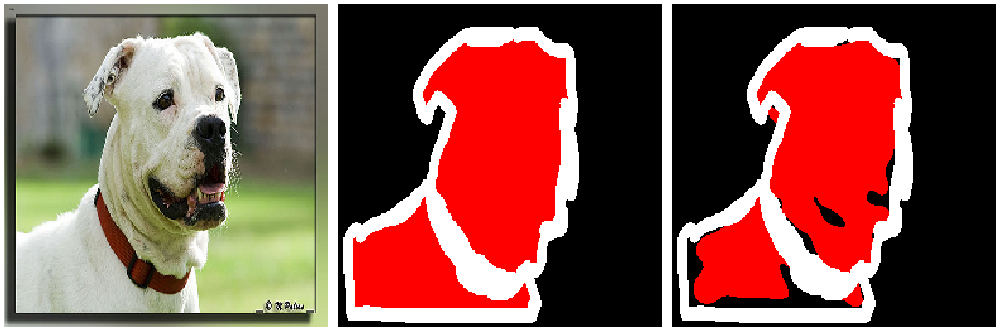

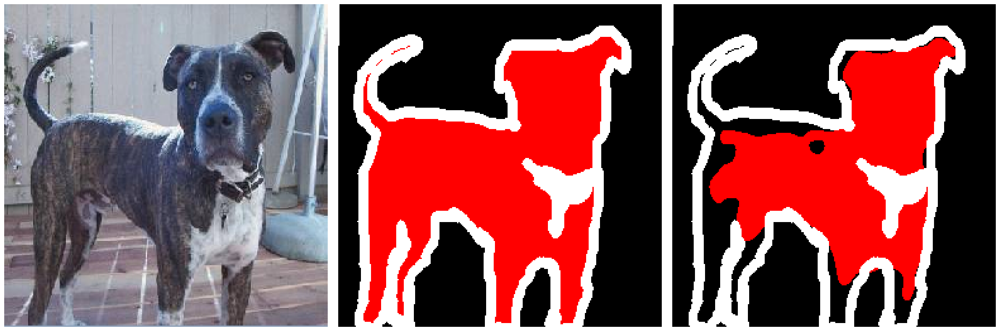

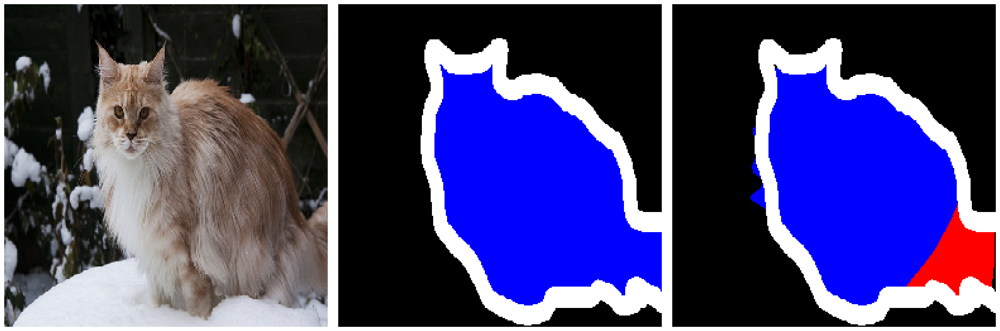

In [ ]:
# Example predictions from the trained network:
img_idx = np.random.randint(0, 100)
for idx, (input, target) in enumerate(test_dataloader):
    if idx < img_idx:
        continue
    draw((input.squeeze(), target.squeeze()), t_dict, dl_prediction[idx])
    plt.pause(0.1)
    if idx == img_idx + 2:
        break

**FocalLoss**

In [ ]:
from torch.optim.lr_scheduler import StepLR

# Training configuration for Focal Loss experiment
train_config = {
    "num_epochs": 2,  # Approximate training time: ~20 minutes on GPU
    "optimizer": torch.optim.Adam,
    "optimizer_params": {
        "lr": 1e-3,
        "weight_decay": 1e-5
    },
    "loss_fn": metric_class.FocalLoss,  # Now using Focal Loss
    "scheduler": StepLR,
    "scheduler_params": {
        "step_size": 50,
        "gamma": 0.85
    },
    "validate_each_iter": 10,
    "writer": SummaryWriter(comment="Floss"),  # TensorBoard writer for Focal Loss
    "save_model_path": "model_floss",
    "metric_class": metric_class
}

# Instantiate the network with Focal Loss configuration
net = PSPNet(
    pretrained_model,
    SegmentationHead,
    num_classes=3,
    train_config=train_config
).to(DEVICE)

print("# of trainable parameters in the network:", count_parameters(net))

Pretrained main module conv1 is loaded
Pretrained main module bn1 is loaded
Pretrained main module relu is loaded
Pretrained main module maxpool is loaded
Pretrained main module layer1 is loaded
Pretrained main module layer2 is loaded
Pretrained supp module layer3 is loaded
Pretrained supp module layer4 is loaded
#параметров в сети: 31107843


In [34]:
net.train_model(train_dataloader, val_dataloader)

Epoch: 1/2 || Iter: 0/184 || Loss: 0.8413152694702148
Epoch: 1/2 || Iter: 10/184 || Loss: 0.2114536315202713
Epoch: 1/2 || Iter: 20/184 || Loss: 0.21113239228725433
Epoch: 1/2 || Iter: 30/184 || Loss: 0.2194262146949768
Epoch: 1/2 || Iter: 40/184 || Loss: 0.1297484040260315
Epoch: 1/2 || Iter: 50/184 || Loss: 0.09471794217824936
Epoch: 1/2 || Iter: 60/184 || Loss: 0.08812769502401352
Epoch: 1/2 || Iter: 70/184 || Loss: 0.07923467457294464
Epoch: 1/2 || Iter: 80/184 || Loss: 0.06477033346891403
Epoch: 1/2 || Iter: 90/184 || Loss: 0.09220374375581741
Epoch: 1/2 || Iter: 100/184 || Loss: 0.1379406899213791
Epoch: 1/2 || Iter: 110/184 || Loss: 0.09103628993034363
Epoch: 1/2 || Iter: 120/184 || Loss: 0.06624253839254379
Epoch: 1/2 || Iter: 130/184 || Loss: 0.05977928265929222
Epoch: 1/2 || Iter: 140/184 || Loss: 0.11446917057037354
Epoch: 1/2 || Iter: 150/184 || Loss: 0.07421781867742538
Epoch: 1/2 || Iter: 160/184 || Loss: 0.06896282732486725
Epoch: 1/2 || Iter: 170/184 || Loss: 0.15581750

In [35]:
torch.cuda.empty_cache()

In [ ]:
# Test the second model (trained with Focal Loss) and compare metrics:
net.load_state_dict(torch.load("model_floss_1.pth"))  # Change suffix _1 to the appropriate epoch if needed
net.eval()

dl_prediction, dl_target = net.test_model(test_dataloader)

print("Mean IoU metric: ", metric_class.IoUMetric(dl_prediction, dl_target))
print("Mean Recall metric: ", metric_class.RecallMetric(dl_prediction, dl_target))

Mean IoU metric:  tensor(0.8824)
Mean Recall metric:  tensor(0.9432)


In [37]:
torch.cuda.empty_cache()

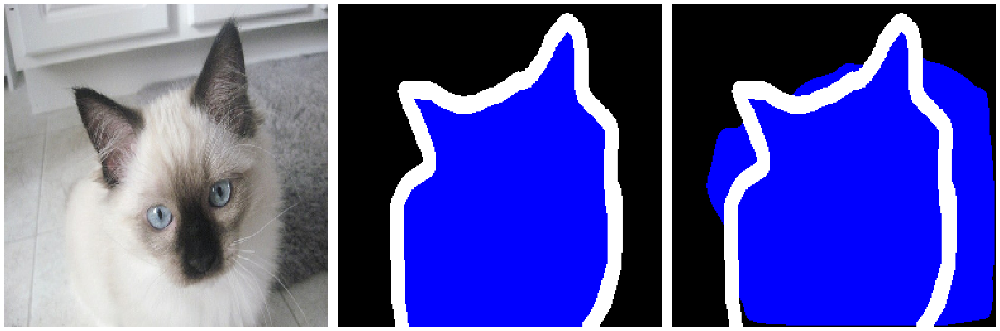

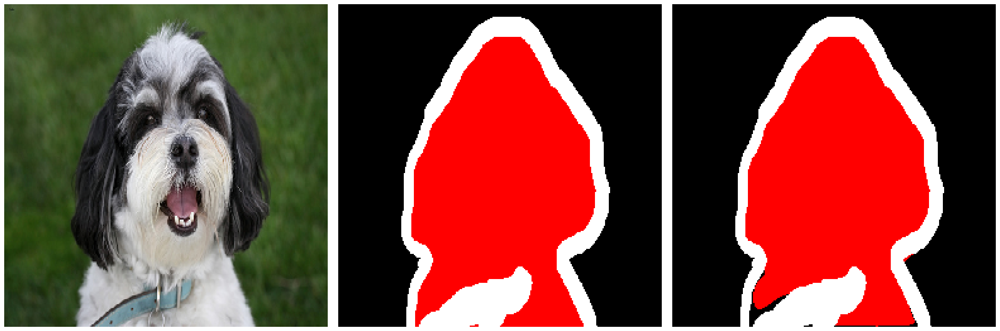

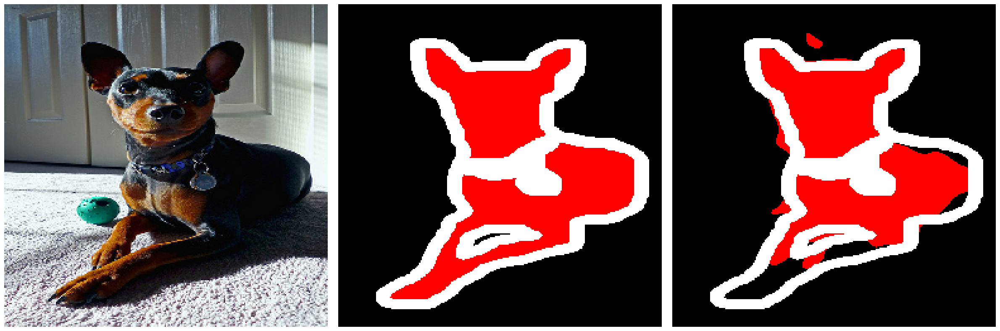

In [ ]:
# Example predictions from the network trained with Focal Loss:
img_idx = np.random.randint(0, 100)
for idx, (input, target) in enumerate(test_dataloader):
    if idx < img_idx:
        continue
    draw((input.squeeze(), target.squeeze()), t_dict, dl_prediction[idx])
    plt.pause(0.1)
    if idx == img_idx + 2:
        break

In [39]:
%load_ext tensorboard
%tensorboard --logdir ./runs

<IPython.core.display.Javascript object>

In [44]:
!zip -r ./tensorboard.zip ./runs

  adding: runs/ (stored 0%)
  adding: runs/Nov05_10-37-07_7c3d447299a3Floss/ (stored 0%)
  adding: runs/Nov05_10-37-07_7c3d447299a3Floss/events.out.tfevents.1699180627.7c3d447299a3.489.1 (deflated 6%)
  adding: runs/Nov05_09-38-07_7c3d447299a3CEloss/ (stored 0%)
  adding: runs/Nov05_09-38-07_7c3d447299a3CEloss/events.out.tfevents.1699177087.7c3d447299a3.489.0 (deflated 6%)
